# Project [SCP]: SPY Correlation Prediction on selected stocks

* Objective: Predict the correlation of GOOG, AMZN, JPM, GME, and XOM with the SPY index for
the next two months using only historical prices.
* Instructions:
  * Data Collection: Download the historical price data for the stocks GOOG, AMZN, JPM,
GME, XOM, and the SPY index from Yahoo Finance or other sources. Ensure to account
for corporate adjustments.
  * Data Preprocessing: Clean the data by handling any missing values, outliers, or
anomalies. Check for corporate adjustments and account for them.
  * Model Selection: Choose an appropriate model to predict future correlations.
Consider models suitable for time series forecasting.
  * Model Training and Validation: Train the chosen model using historical correlations and
validate its performance.
  * Evaluation: Assess the model's predictive accuracy using suitable metrics.
  * Report: Present your findings detailing the approach, choice of model, and achieved
results. Please attach your code.

### 0. Imports and Configs

In [111]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import yfinance as yf
from plotly.subplots import make_subplots
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from xbbg import blp

In [66]:
tickers = ['GOOG', 'AMZN', 'JPM', 'GME', 'XOM', 'SPY']
window = 42  # predict the next two months correlation ~ 42 trading days
period = '19y'  # earliest history of GOOG

### 1. Data Collection

We download the historical price data from Yahoo Finance, it contains many columns - 

* Date: This is the index in our time series that specifies the date associated with the price.
* Close: The last price at stock was executed on that day.
* Adj Close: The closing price adjusted for dividends and stock splits.

We’ll use the Adj close price to account for corporate adjustments.

In [49]:
close = yf.download(tickers, period=period).xs('Adj Close', axis=1)
close

[*********************100%***********************]  6 of 6 completed


,AMZN,GME,GOOG,JPM,SPY,XOM
Date,,,,,,
2004-09-29,2.042000,1.529233,3.264763,23.678207,77.461266,25.731062
2004-09-30,2.043000,1.557849,3.227901,23.708046,77.405891,25.827267
2004-10-01,2.023500,1.592355,3.302123,24.072042,78.714890,26.126524
2004-10-04,2.050500,1.679043,3.363891,23.927614,78.846489,26.142559
2004-10-05,2.048000,1.702608,3.446332,23.747074,78.888046,26.356310
...,...,...,...,...,...,...
2023-09-22,129.119995,17.180000,131.250000,145.729996,430.420013,114.940002
2023-09-25,131.270004,17.670000,132.169998,146.449997,432.230011,116.230003
2023-09-26,125.980003,16.780001,129.449997,144.929993,425.880005,116.410004


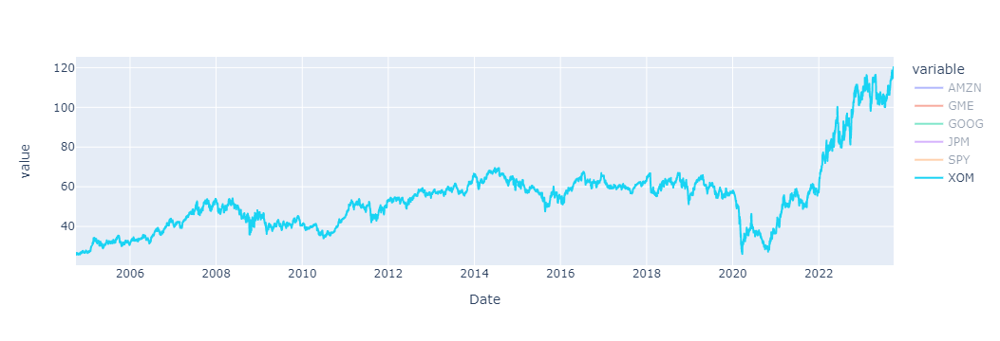

In [51]:
close.plot(backend='plotly')

To cross-check, we also download price from Bloomberg as a validation in Data Preprocessing. Please note we apply `all` adjustments to get adjust close.

```
    adjust: `all`, `dvd`, `normal`, `abn` (=abnormal), `split`, `-` or None
            exact match of above words will adjust for corresponding events
            Case 0: `-` no adjustment for dividend or split
            Case 1: `dvd` or `normal|abn` will adjust for all dividends except splits
            Case 2: `adjust` will adjust for splits and ignore all dividends
            Case 3: `all` == `dvd|split` == adjust for all
            Case 4: None == Bloomberg default OR use kwargs         
```

In [52]:
close_blp = blp.bdh([t + ' US Equity' for t in tickers], flds=['PX_LAST'], start_date=close.index[0],
                    adjust='all').droplevel(1, 1)
close_blp.columns = close_blp.columns.str[:-10]
close_blp

,GOOG,AMZN,JPM,GME,XOM,SPY
2004-09-29,NaN,2.042,23.6783,1.5292,25.7310,77.4578
2004-09-30,NaN,2.043,23.7081,1.5579,25.8272,77.4024
2004-10-01,NaN,2.023,24.0721,1.5924,26.1265,78.7113
2004-10-04,NaN,2.051,23.9277,1.6790,26.1425,78.8429
2004-10-05,NaN,2.048,23.7472,1.7026,26.3563,78.8845
...,...,...,...,...,...,...
2023-09-22,131.25,129.120,145.7300,17.1800,114.9400,430.4200
2023-09-25,132.17,131.270,146.4500,17.6700,116.2300,432.2300
2023-09-26,129.45,125.980,144.9300,16.7800,116.4100,425.8800
2023-09-27,131.46,125.980,145.7800,17.1500,120.2000,426.0500


In [53]:
ret_blp = blp.bdh([t + ' US Equity' for t in tickers], flds=['CHG_PCT_1D'], start_date=close.index[0],
                  adjust='all').droplevel(1, 1) / 100
ret_blp.columns = ret_blp.columns.str[:-10]
ret_blp

,GOOG,AMZN,JPM,GME,XOM,SPY
2004-09-29,NaN,0.035760,0.007618,0.021935,-0.007830,0.005032
2004-09-30,NaN,0.000490,0.001260,0.018712,0.003738,-0.000715
2004-10-01,NaN,-0.009545,0.015354,0.022150,0.011587,0.016911
2004-10-04,NaN,0.013343,-0.006000,0.054440,0.000614,0.001672
2004-10-05,NaN,-0.001219,-0.007545,0.014035,0.008177,0.000527
...,...,...,...,...,...,...
2023-09-22,-0.000837,-0.001624,-0.009583,0.009401,0.001568,-0.002249
2023-09-25,0.007010,0.016651,0.004941,0.028522,0.011223,0.004205
2023-09-26,-0.020580,-0.040299,-0.010379,-0.050368,0.001549,-0.014691
2023-09-27,0.015527,0.000000,0.005865,0.022050,0.032557,0.000399


### 2. Data Preprocessing

#### Convert historical price to correlation

* Please note we have applied corporate adjustments on both Yahoo Finance source and Bloomberg data via API call, so `pct_change` is proper to retrieve daily returns from adjust close.
* Correlation is calculated from daily returns, while our goal is to forecast correlations for the next two months, so we resample the data at 2 month frequency

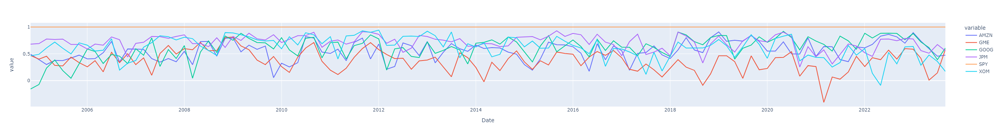

In [65]:
ret = close.pct_change().dropna()
corr = ret.rolling(window=window, min_periods=window).corr(ret['SPY']).resample('2BMS').first().dropna()
corr.plot(backend='plotly')

#### Find missing values 

* view null counts using a ts plot
* below shows no missing values along the history

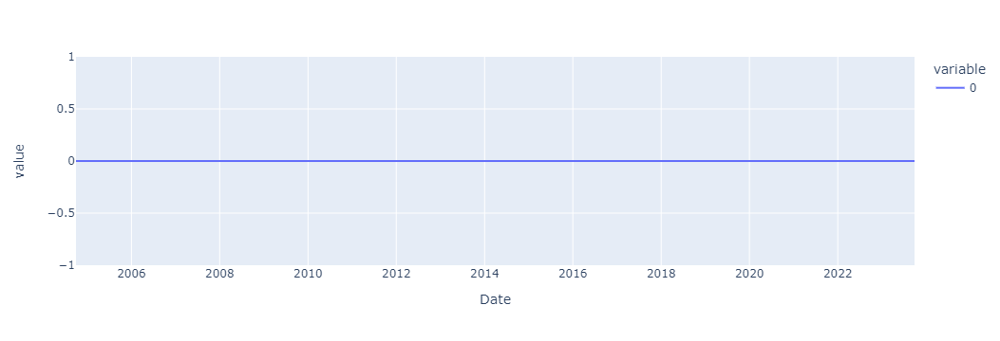

In [67]:
close.isnull().sum(1).plot(backend='plotly')

#### Find outliers 
* using a box plot
* GME has upper outliers, but it relates to the GameStop short squeeze In January 2021, Reddit users on the r/wallstreetbets subreddit built the foundations for a short squeeze on GameStop, pushing up the stock price significantly, validated correctness
* GOOG/XOM's outlier comes from peak period, validated correctness via Google Finance

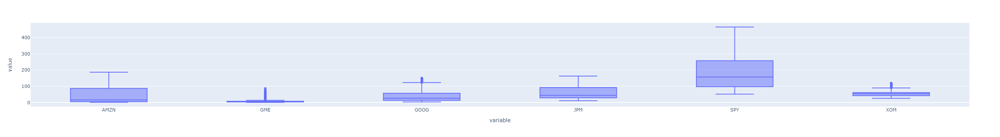

In [71]:
fig = px.box(close)
fig.show()

#### Find anomalies

* using the difference between data from Yahoo Finance and Bloomberg (please ignore last day difference comes from live feed lag if you run during trade hours)
* TODO: there were large spikes in earlier history

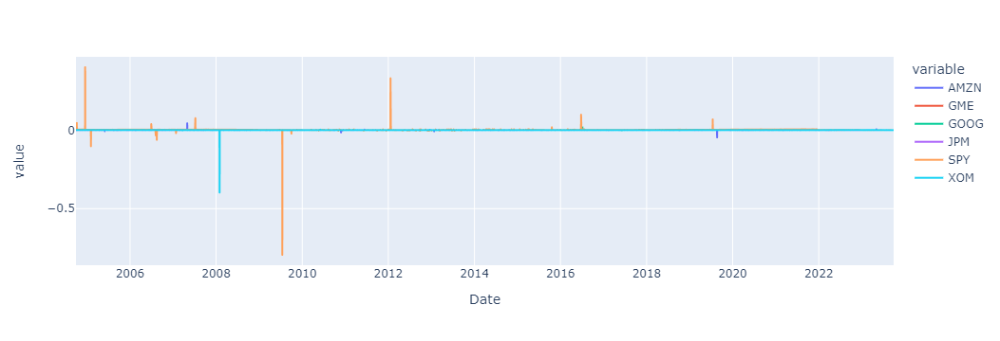

In [85]:
(close - close_blp).plot(backend='plotly')

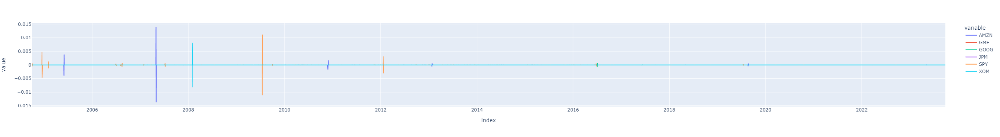

In [86]:
(ret - ret_blp).plot(backend='plotly')

### 3. Model selection

A wide array of methods are available for time series forecasting. One of the most commonly used is Autoregressive Moving Average (ARMA), which is a statistical model that predicts future values using past values. This method for making time series predictions is flawed, however, because it doesn’t capture seasonal trends. It also assumes that the time series data is stationary, meaning that its statistical properties wouldn’t change over time. This type of behavior is an idealized assumption that doesn’t hold in practice, however, which means ARMA may provide skewed results. 

An extension of ARMA is the Autoregressive Integrated Moving Average (ARIMA) model, which doesn’t assume stationarity but does still assume that the data exhibits little to no seasonality. Fortunately, the seasonal ARIMA (SARIMA) variant is a statistical model that can work with non-stationary data and capture some seasonality. Additional popular time series forecasting packages are Prophet and DeepAR. Prophet is an additive model developed by Facebook where non-linear trends are fit to seasonality effects such as daily, weekly, yearly and holiday trends. DeepAR is a package developed by Amazon that enables time series forecasting with recurrent neural networks. 

Here, we will build ARMA, ARIMA, SARIMA, Prophet and DeepAR models to make a time series prediction on the future 2m correlation of GOOG, AMZN, JPM, GME, XOM, vs the SPY index.

### 4. Model Training and Validation

#### Splitting Data for Training and Testing

An important part of model building is splitting our data for training and testing, which ensures that you build a model that can generalize outside of the training data and that the performance and outputs are statistically meaningful. 

We will split our data such that everything before 2023 will serve as training data, with everything after 2023 becoming the testing data:

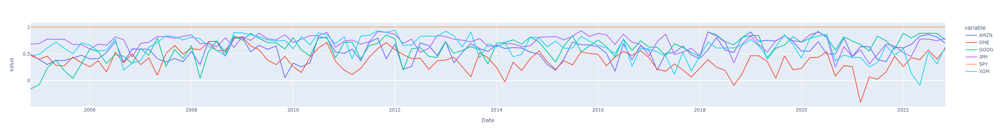

In [88]:
train = corr[corr.index < "2023-01-01"]
test = corr[corr.index >= "2023-01-01"]

train.plot(backend='plotly')

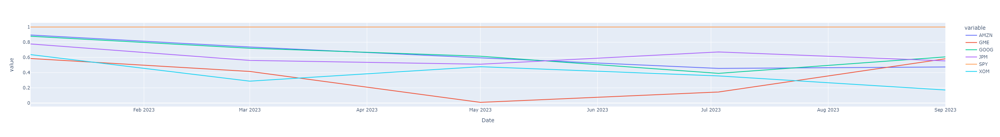

In [89]:
test.plot(backend='plotly')

#### 4.1 Autoregressive Moving Average (ARMA)

The term “autoregressive” in ARMA means that the model uses past values to predict future ones. Specifically, predicted values are a weighted linear combination of past values. This type of regression method is similar to linear regression, with the difference being that the feature inputs here are historical values. 

Moving average refers to the predictions being represented by a weighted, linear combination of white noise terms, where white noise is a random signal. The idea here is that ARMA uses a combination of past values and white noise in order to predict future values.

Define an ARMA model using the SARIMAX package. To define an ARMA model with the SARIMAX class, we pass in the order parameters of (1, 0 ,1). Alpha corresponds to the significance level of our predictions. Typically, we choose an alpha = 0.05. Here, the ARIMA algorithm calculates upper and lower bounds around the prediction such that there is a 5 percent chance that the real value will be outside of the upper and lower bounds. This means that there is a 95 percent confidence that the real value will be between the upper and lower bounds of our predictions.

Generate our predictions (we use independent model per ticker):

In [105]:
y_pred_out = pd.DataFrame()

for t in tickers:
    ARMAmodel = SARIMAX(train[t], order=(1, 0, 1))
    ARMAmodel = ARMAmodel.fit()

    y_pred = ARMAmodel.get_forecast(len(test.index))
    y_pred_df = y_pred.conf_int(alpha=0.05)
    y_pred_df[t + '^'] = ARMAmodel.predict(start=y_pred_df.index[0], end=y_pred_df.index[-1])
    y_pred_df.index = test.index
    y_pred_out[t + '^'] = y_pred_df[t + '^']

C:\Users\Weiyi\anaconda3\lib\site-packages\statsmodels\base\model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [107]:
y_pred_out

,GOOG^,AMZN^,JPM^,GME^,XOM^,SPY^
Date,,,,,,
2023-01-02,0.801835,0.652515,0.653514,0.480026,0.406508,0.999999
2023-03-01,0.799778,0.652364,0.653364,0.471383,0.405228,0.999998
2023-05-01,0.797726,0.652213,0.653214,0.462896,0.403951,0.999998
2023-07-03,0.795679,0.652062,0.653064,0.454561,0.402679,0.999997
2023-09-01,0.793637,0.651910,0.652915,0.446377,0.401410,0.999996


And plot the results:

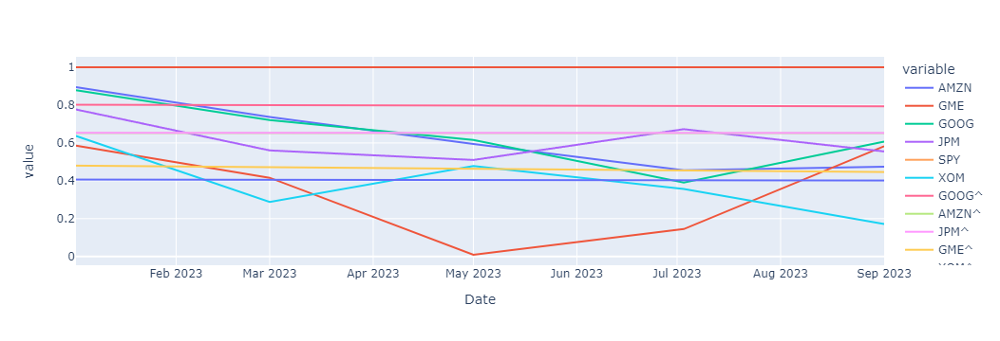

In [108]:
pd.concat([test, y_pred_out], axis=1).plot(backend='plotly')

We can also evaluate the performance using the root mean-squared error:

,lower AMZN,upper AMZN,AMZN^
Date,,,
2023-01-02,0.314378,0.990652,0.652515
2023-03-01,0.313034,0.991694,0.652364
2023-05-01,0.311695,0.992731,0.652213
2023-07-03,0.310360,0.993763,0.652062
2023-09-01,0.309030,0.994791,0.651910
